> Projeto Desenvolve <br>
Programação Intermediária com Python <br>
Profa. Camila Laranjeira (mila@projetodesenvolve.com.br) <br>

# 4.2 - APIs


## Exercícios 🔭🌌🪐

Vamos acessar as APIs da NASA para ver algumas imagens interessantes capturadas universo afora!

#### Q1.
Crie uma chave no site oficial:
* https://api.nasa.gov

Vamos armazenar a chave de forma segura! <br>
Salve a sua chave em um arquivo `key.json` na forma:
`API_KEY=SUA_CHAVE`

Adicione o nome do arquivo `key.json` ao `.gitignore` do repositório que você fará upload da atividade.
Para isso basta abrir o arquivo `.gitignore` na pasta raíz do repositório (ou criar um caso ele não exista). Dentro do arquivo, apenas adiciona o nome do arquivo que deseja ignorar.

#### Q2. 🛰 Astronomy Picture of the Day (APOD) 🌌
> Antes de fazer os exercícios, devo te lembrar que existem limites de acesso às APIs, descritas na página principal, portanto pega leve na tentativa e erro na hora de testar seu código.

<img width=500 src=https://apod.nasa.gov/apod/image/2407/M24-HaLRGB-RC51_1024.jpg>

A primeira API que acessaremos é a mais popular de todas: astronomy picture of the day (foto astronômica do dia).

Faça uma requisição GET para a URL da API que retorna a imagem do dia! Essa é fácil já que são os valores padrão da rota principal:
* URL base: `'https://api.nasa.gov/planetary/apod'`
* Endpoint: não precisa preencher, acessaremos a raíz da API.
* Query params: preencha `api_key` com a sua chave de autenticação. Se animar mexer em outros parâmetros veja [a documentação](https://api.nasa.gov).

Ao receber a resposta (um json), você deve:
* Imprimir os campos `copyright` e `explanation`
* Com as biblioteca scikit-images e matplotlib, apresente a imagem a partir do campo `url` ou `hdurl`, e preencha o título do plot com o campo `title` do json. Uma dica de código a seguir.
```python
from skimage import io
img = io.imread(url)
## plot a matriz img com matplotlib (imshow)
```   

In [ ]:
from google.colab import files

uploaded = files.upload()

Saving Key.json to Key (1).json


COPYRIGHT: N/A
EXPLANATION: Like Earth's moon, Saturn's largest moon Titan is locked in synchronous rotation with its planet. This mosaic of images recorded by the Cassini spacecraft in May of 2012 shows its anti-Saturn side, the side always facing away from the ringed gas giant. The only moon in the solar system with a dense atmosphere, Titan is the only solar system world besides Earth known to have standing bodies of liquid on its surface and an earthlike cycle of liquid rain and evaporation. Its high altitude layer of atmospheric haze is evident in the Cassini view of the 5,000 kilometer diameter moon over Saturn's rings and cloud tops. Near center is the dark dune-filled region known as Shangri-La. The Cassini-delivered Huygens probe rests below and left of center, after the most distant landing for a spacecraft from Earth.


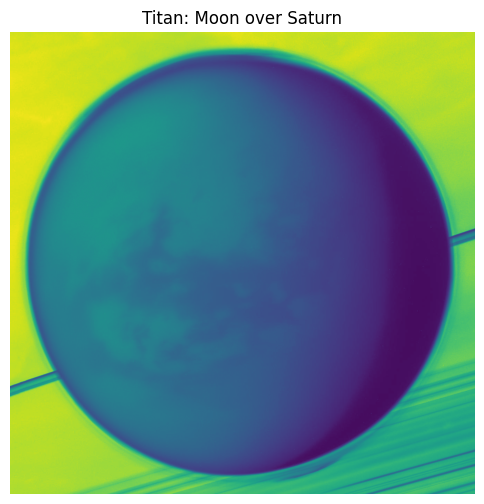

In [ ]:
import json
import requests
from skimage import io
import matplotlib.pyplot as plt

# Chave da API do arquivo key.json
with open('key.json') as f:
    data = json.load(f)
    api_key = data['API_KEY']

# URL base da API APOD
url = 'https://api.nasa.gov/planetary/apod'

# Parâmetros da requisição
params = {
    'api_key': api_key
}

# Fazer requisição GET
response = requests.get(url, params=params)
apod_data = response.json()

# Imprimir copyright e explicação
print(f"COPYRIGHT: {apod_data.get('copyright', 'N/A')}")
print(f"EXPLANATION: {apod_data['explanation']}")

# Carregar e exibir a imagem
image_url = apod_data.get('hdurl', apod_data['url'])
img = io.imread(image_url)

# Mostrar imagem com matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis('off')
plt.title(apod_data['title'])
plt.show()


#### Q3. Limites
A partir da resposta da query anterios, imprima o header da resposta e consulte os atributos:
* X-RateLimit-Limit: o limite total de requisições da sua chave de API
* X-RateLimit-Remaining: o limite restante de requisições da sua chave de API

X-RateLimit-Limit: 2000
X-RateLimit-Remaining: 1997

COPYRIGHT: N/A
EXPLANATION: Like Earth's moon, Saturn's largest moon Titan is locked in synchronous rotation with its planet. This mosaic of images recorded by the Cassini spacecraft in May of 2012 shows its anti-Saturn side, the side always facing away from the ringed gas giant. The only moon in the solar system with a dense atmosphere, Titan is the only solar system world besides Earth known to have standing bodies of liquid on its surface and an earthlike cycle of liquid rain and evaporation. Its high altitude layer of atmospheric haze is evident in the Cassini view of the 5,000 kilometer diameter moon over Saturn's rings and cloud tops. Near center is the dark dune-filled region known as Shangri-La. The Cassini-delivered Huygens probe rests below and left of center, after the most distant landing for a spacecraft from Earth.


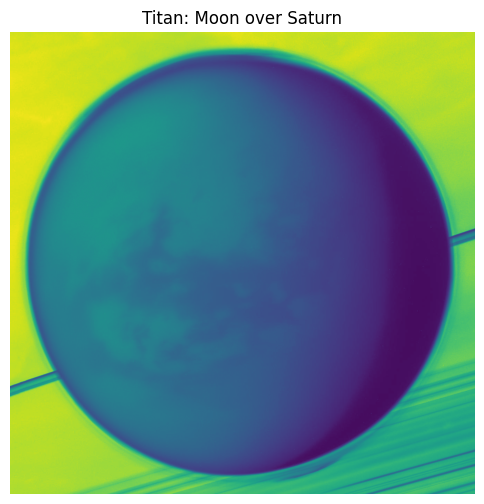

In [ ]:
import json
import requests
from skimage import io
import matplotlib.pyplot as plt

# Carrega chave da API do arquivo key.json
with open('key.json') as f:
    data = json.load(f)
    api_key = data['API_KEY']

# URL base da API APOD
url = 'https://api.nasa.gov/planetary/apod'
params = {'api_key': api_key}

# Faz requisição GET
response = requests.get(url, params=params)
apod_data = response.json()

# Imprimir informações do cabeçalho da resposta
headers = response.headers
print("X-RateLimit-Limit:", headers.get('X-RateLimit-Limit', 'Não informado'))
print("X-RateLimit-Remaining:", headers.get('X-RateLimit-Remaining', 'Não informado'))

print("\nCOPYRIGHT:", apod_data.get('copyright', 'N/A'))
print("EXPLANATION:", apod_data['explanation'])

# Carrega e exibe a imagem
image_url = apod_data.get('hdurl', apod_data['url'])
img = io.imread(image_url)

plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis('off')
plt.title(apod_data['title'])
plt.show()


### Q4. Mars Rover Photos 🚀🚙 📷

<img width=500 src=https://www.nasa.gov/wp-content/uploads/2019/10/pia23378-16.jpg>

Essa API retorna dados (incluindo imagens capturadas) sobre os veículos que hoje habitam o planeta Marte. São os rovers `opportunity`, `spirit` e o mais famoso, o `curiosity` (da foto acima).

Antes de requisitar imagens, vamos ver o relatório de dados coletados por um deles, o `curiosity`. Isso vai nos ajudar a montar a query de imagens coletadas.

Faça uma requisição GET para a seguinte URL:
* URL base: `'https://api.nasa.gov/mars-photos/api/v1'`
* endpoint: `'/manifests/{nome_do_rover}'`
* query parameters: preencha `api_key` com a sua chave de autenticação.

Extraia o json da resposta retornada. O campo principal é o `'photo_manifest'`, do qual queremos acessar os seguintes valores:
* `max_sol`: Máximo "dia marciano" de coleta de fotos. O dia marciano tem 24 horas, 39 minutos e 35 segundos.
* `max_date`: Última data terrestre de coleta de fotos, na forma `'aaaa-mm-dd'`.

Imprima esses dois atributos da resposta e os use no próximo exercício para coletar as fotos mais recentes tiradas.

In [ ]:
import json
import requests

# Carrega a chave da API
with open('key.json') as f:
    api_key = json.load(f)['API_KEY']

# URL base e endpoint para o rover Curiosity
url = 'https://api.nasa.gov/mars-photos/api/v1/manifests/curiosity'
params = {'api_key': api_key}

# Requisição GET
response = requests.get(url, params=params)
data = response.json()

# Acessa o dicionário 'photo_manifest'
manifest = data['photo_manifest']

max_sol = manifest['max_sol']
max_date = manifest['max_date']

# Imprime resultados
print(f"Último dia marciano com fotos (max_sol): {max_sol}")
print(f"Última data terrestre com fotos (max_date): {max_date}")


Último dia marciano com fotos (max_sol): 4528
Última data terrestre com fotos (max_date): 2025-05-02


#### Q5.

Faça uma requisição GET para a URL da API que retorna links para as imagens coletadas pelos rovers.

* URL base: `'https://api.nasa.gov/mars-photos/api/v1'`
* Endpoint: `/rovers/{nome_do_rover}/photos`
* Query params sugeridos:
    * `api_key`: sua chave de autenticação.
    * `sol`: dia marciano que deseja coletar (de 0 a `max_sol` coletado anteriormente)
    * `page`: você pode paginar entre as respostas! São retornados 25 resultados por página.

A resposta esperada estará no formato a seguir, uma lista no campo `'photos'` onde cada item é um dicionário com os dados da foto tirada. Dentre os dados há o campo `camera` indicando qual das câmeras do rover tirou a foto. As fotos mais interessantes (na minha opinião, claro) são das câmeras de navegação (`"name": "NAVCAM"`) e as de prevenção de colisão (frente: `"name": "FHAZ"` e trás `"name": "RHAZ"`) onde dá pra ver partes do robô!

**Seu trabalho é**:
* Paginar a requisição acima até que a resposta seja `None`
* Escolher uma ou mais câmeras (ex: `NAVCAM`, `FHAZ`, `RHAZ`), e em um laço de repetição plotar todas as imagens retornadas daquela câmera. Use novamente as bibliotecas scikit-image e matplotlib.
  * O título da imagem deve ter a página da requisição, nome da câmera e id da imagem.

```json
{
  "photos": [
    {
      "id": 1228212,
      "sol": 4102,
      "camera": {
        "id": 20,
        "name": "FHAZ",
        "rover_id": 5,
        "full_name": "Front Hazard Avoidance Camera"
      },
      "img_src": "https://mars.nasa.gov/msl-raw-images/proj/msl/redops/ods/surface/sol/04102/opgs/edr/fcam/FLB_761645828EDR_F1060660FHAZ00302M_.JPG",
      "earth_date": "2024-02-19",
      "rover": {
        "id": 5,
        "name": "Curiosity",
        ...
      }
    }
    {
      "id": 1228213,
      "sol": 4102,
      ...
    }
```




📄 Página 1 - 25 fotos encontradas


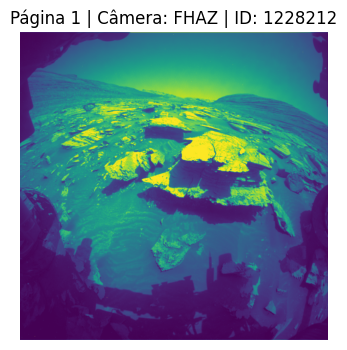

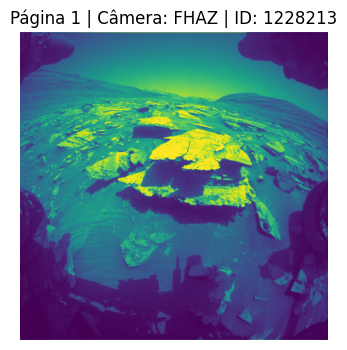

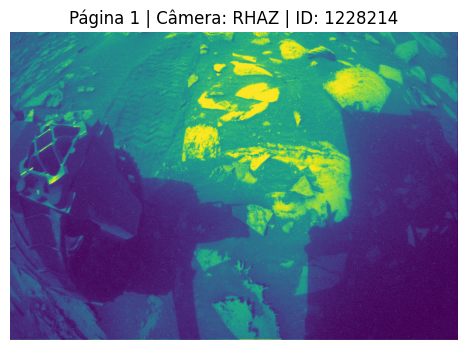

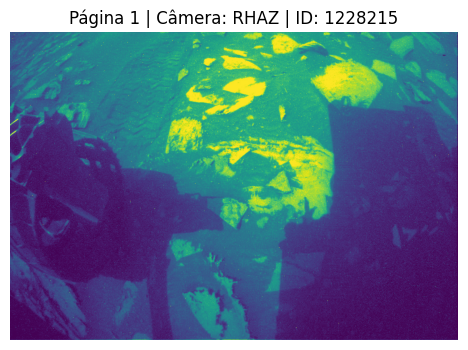

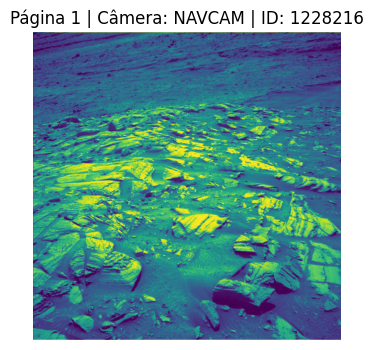

...

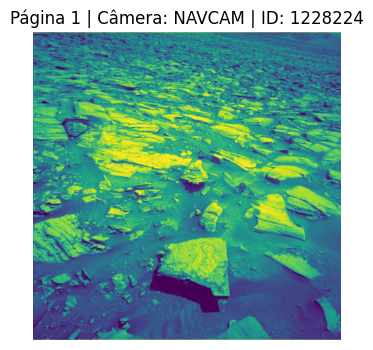

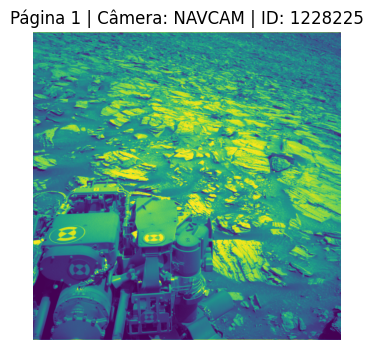

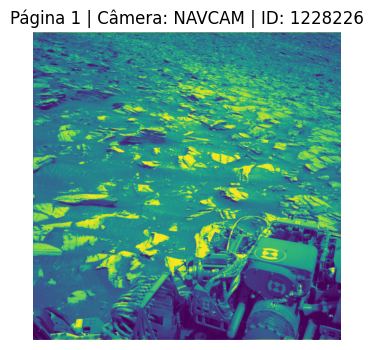

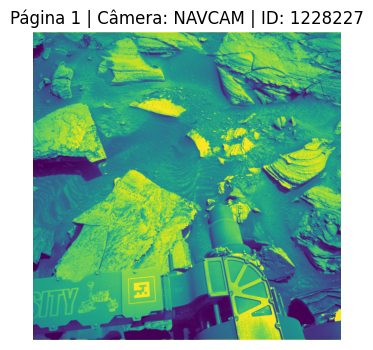

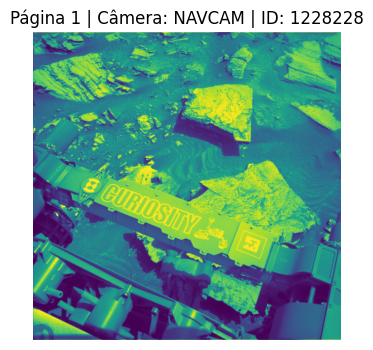


📄 Página 2 - 25 fotos encontradas


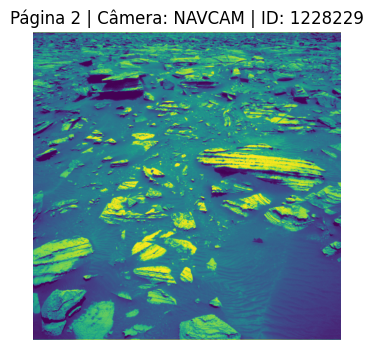

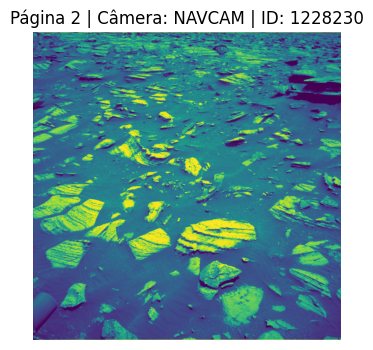

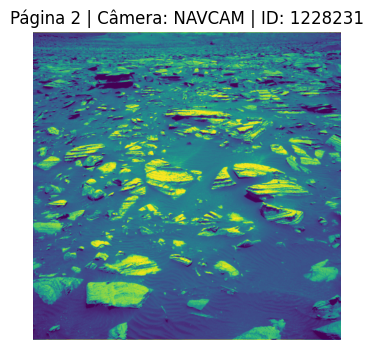

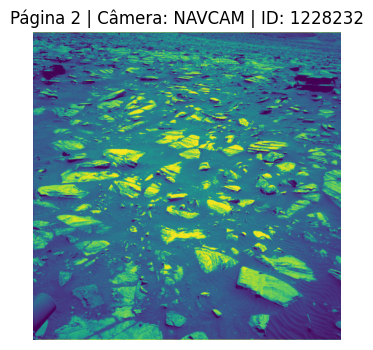

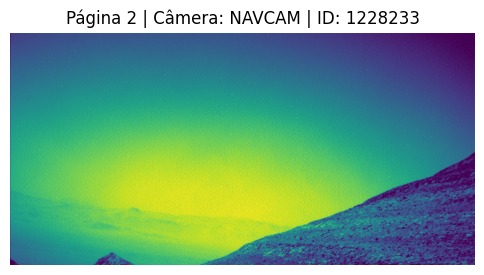

...

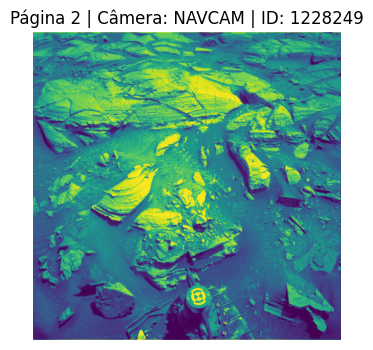

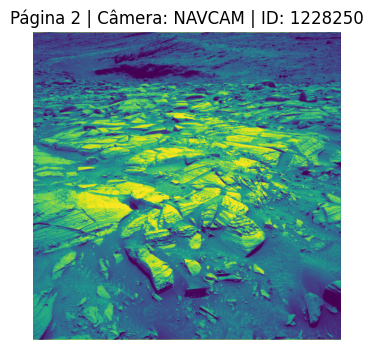

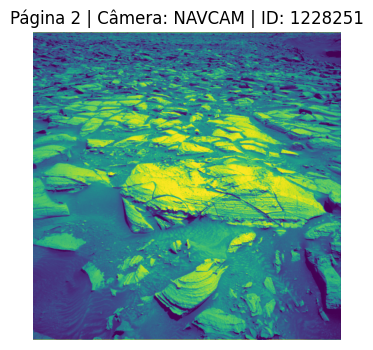

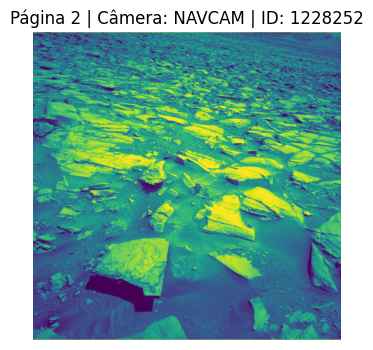

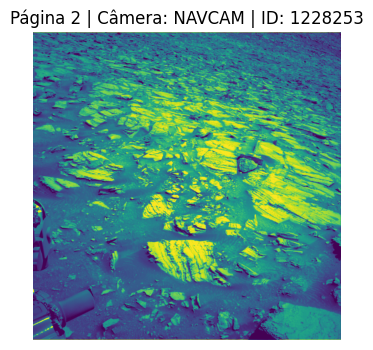


📄 Página 3 - 20 fotos encontradas


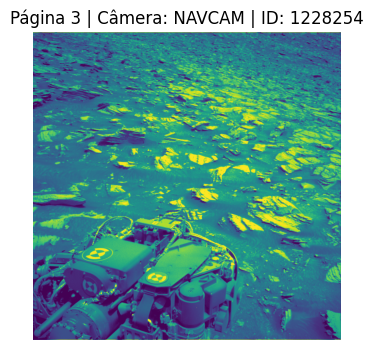

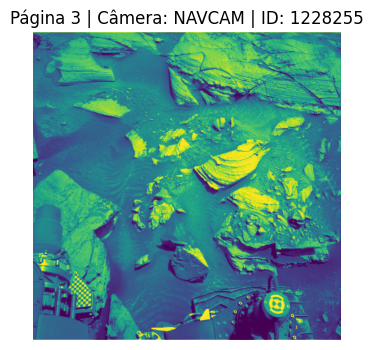

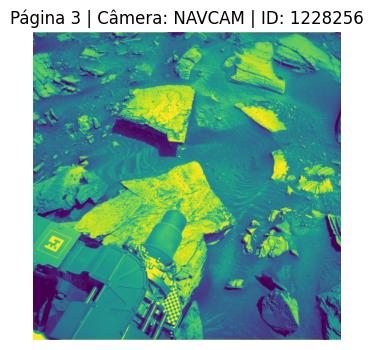

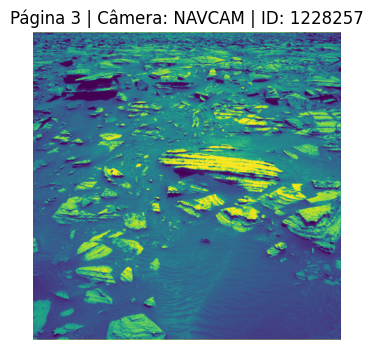

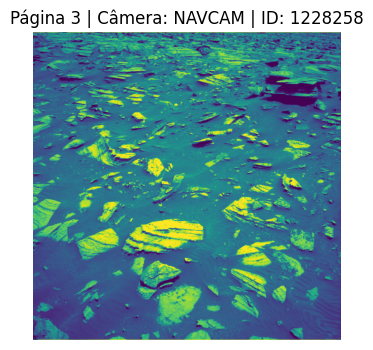

...

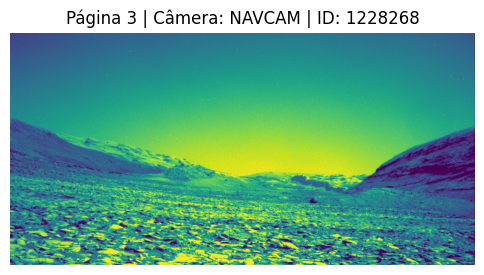

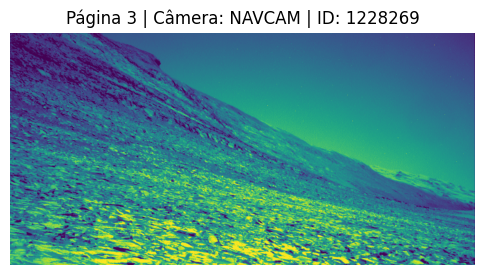

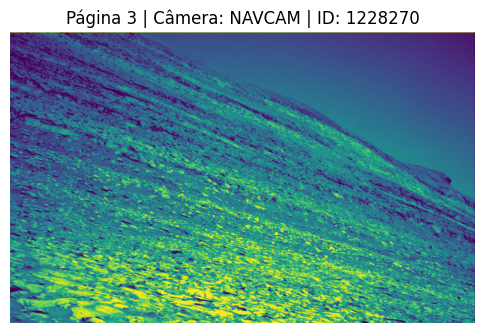

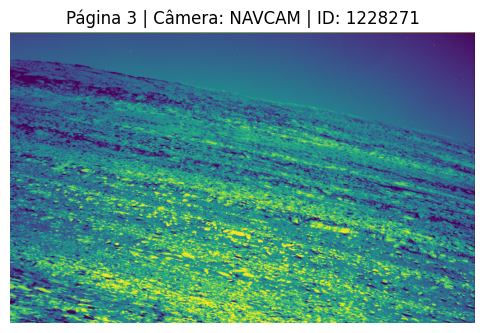

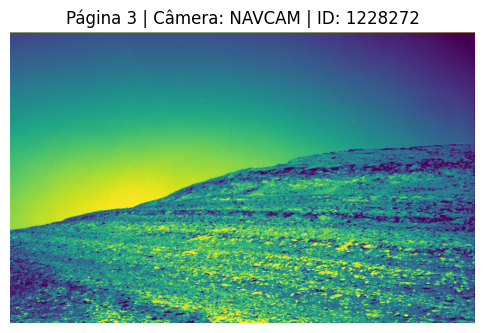

📭 Fim da paginação. Total de imagens exibidas: 61


In [ ]:
import json
import requests
from skimage import io
import matplotlib.pyplot as plt

# Carrega a chave da API
with open('key.json') as f:
    api_key = json.load(f)['API_KEY']

# Configurações da requisição
rover_name = 'curiosity'
sol = 4102
cameras_desejadas = ['FHAZ', 'RHAZ', 'NAVCAM']
base_url = 'https://api.nasa.gov/mars-photos/api/v1/rovers/curiosity/photos'

page = 1
total_imagens = 0

while True:
    params = {
        'api_key': api_key,
        'sol': sol,
        'page': page
    }

    response = requests.get(base_url, params=params)
    data = response.json()

    fotos = data.get('photos', [])

    # Interrompe o loop se não houver mais fotos
    if not fotos:
        print(f"📭 Fim da paginação. Total de imagens exibidas: {total_imagens}")
        break

    print(f"\n📄 Página {page} - {len(fotos)} fotos encontradas")

    for foto in fotos:
        camera = foto['camera']['name']
        if camera in cameras_desejadas:
            total_imagens += 1
            imagem_url = foto['img_src']
            imagem_id = foto['id']

            try:
                imagem = io.imread(imagem_url)
                plt.figure(figsize=(6, 4))
                plt.imshow(imagem)
                plt.axis('off')
                plt.title(f"Página {page} | Câmera: {camera} | ID: {imagem_id}")
                plt.show()
            except Exception as e:
                print(f"Erro ao carregar imagem ID {imagem_id}: {e}")

    page += 1

